# Oxford Flower VLAD and Fisher Vector Retrieval Demo

This notebook demonstrates how to:
1. Load the Oxford Flower dataset.
2. Extract deep convolutional features (last conv layer) from the `resnet18` model.
3. Train a VLAD model on these deep features.
4. Perform image retrieval queries.
5. Show the effect of PCA (reducing features by half before VLAD) on retrieval performance.
6. An analogous procedure is made for Fisher Vectors

### References

[1] Relja Arandjelović and Andrew Zisserman, 'All About VLAD', Department of Engineering Science, University of Oxford. \
[2] Liangliang Wang and Deepu Rajan, "An Image Similarity Descriptor for Classification Tasks," J. Vis. Commun.
Image R., vol. 71, pp. 102847, 2020.



## 1. Imports and Setup

In [1]:
import os

from pyvisim_examples.utils import plot_candidates, plot_image
from pyvisim.classic import FisherVectorEmbedder, VLADEmbedder
from pyvisim.datasets import OxfordFlowerDataset
from pyvisim.image_store import InMemoryImageEmbeddingStore

# Our library imports
from pyvisim.features import DeepConvFeature

### Hyperparameters

**Note**: training k-means models takes quite a bit of time. In this notebook, a single `n_clusters = 256` will be used. Change `NUM_CLUSTERS` to experiment with different cluster sizes.

In [2]:
NUM_CLUSTERS = 32
DIM_REDUCTION_FACTOR = 2

## 2. Declare the Oxford Flower Dataset

In [3]:
train_dataset = OxfordFlowerDataset(purpose="train")
val_dataset = OxfordFlowerDataset(purpose="validation")
print("Number of images in the dataset:", len(train_dataset))

Number of images in the dataset: 6149


### Plot some images from the dataset

Image size: (500, 591, 3)


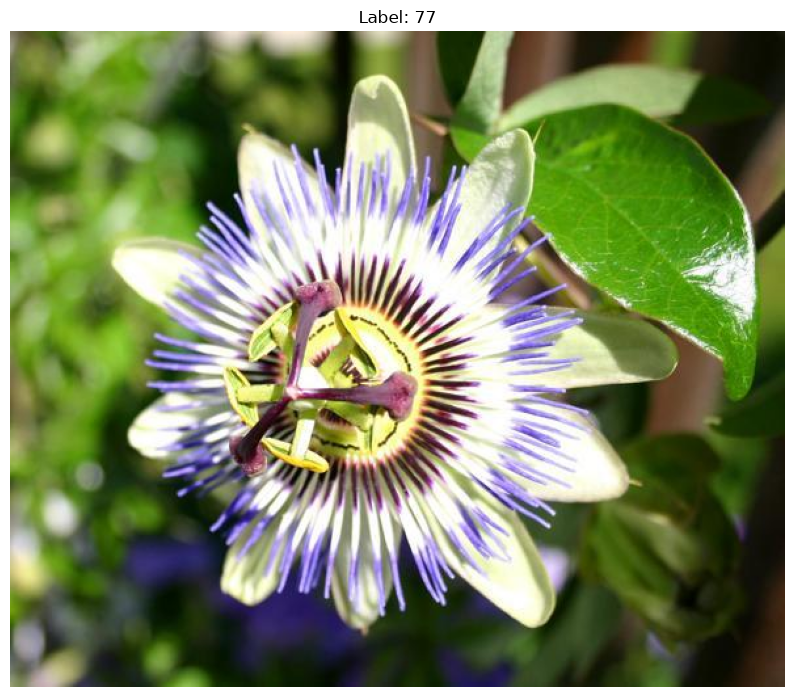

Image size: (500, 625, 3)


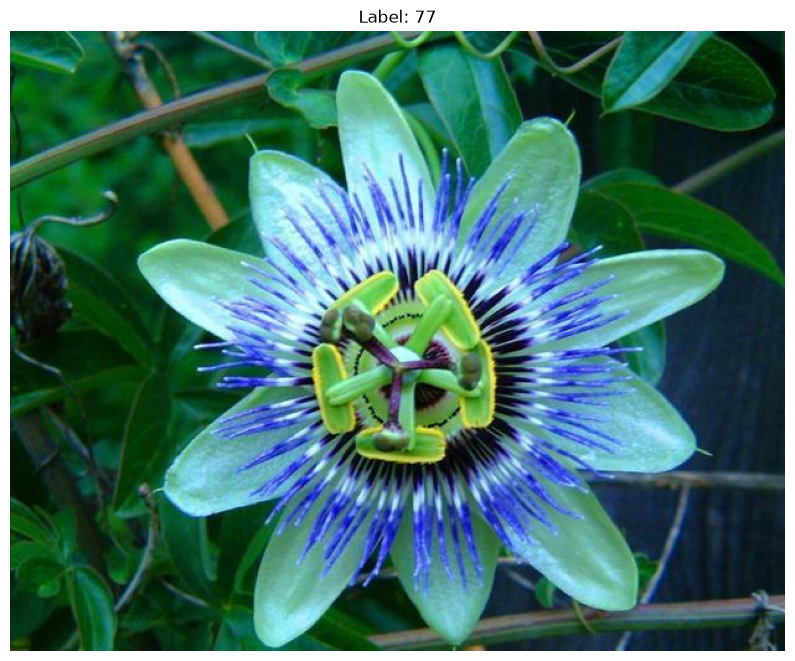

Image size: (667, 500, 3)


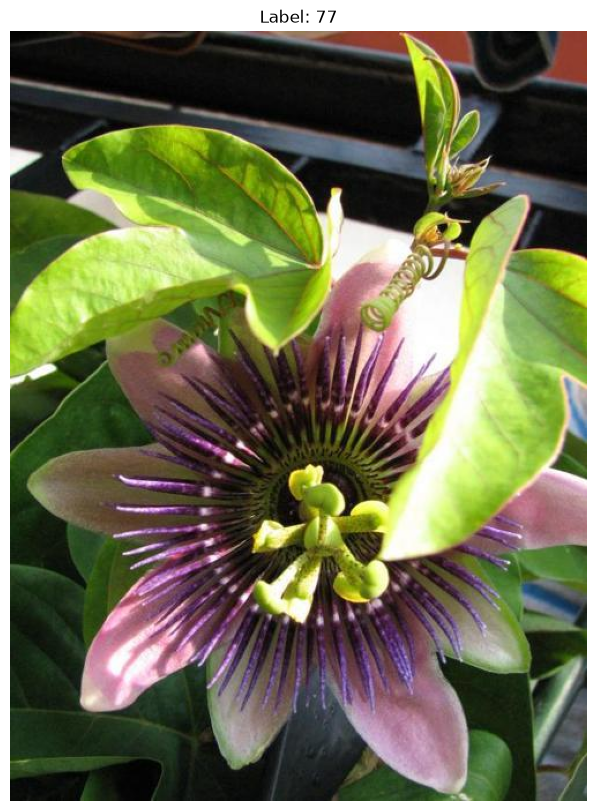

Image size: (500, 667, 3)


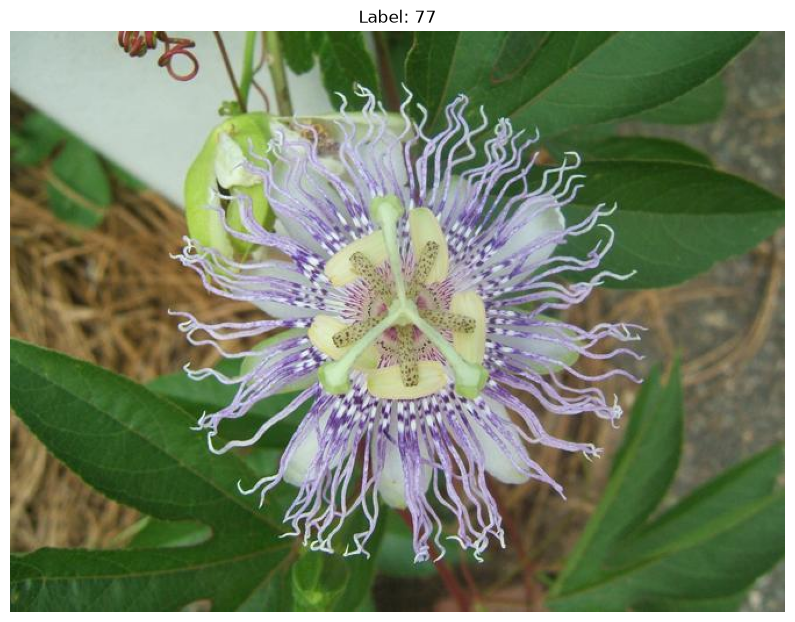

Image size: (500, 508, 3)


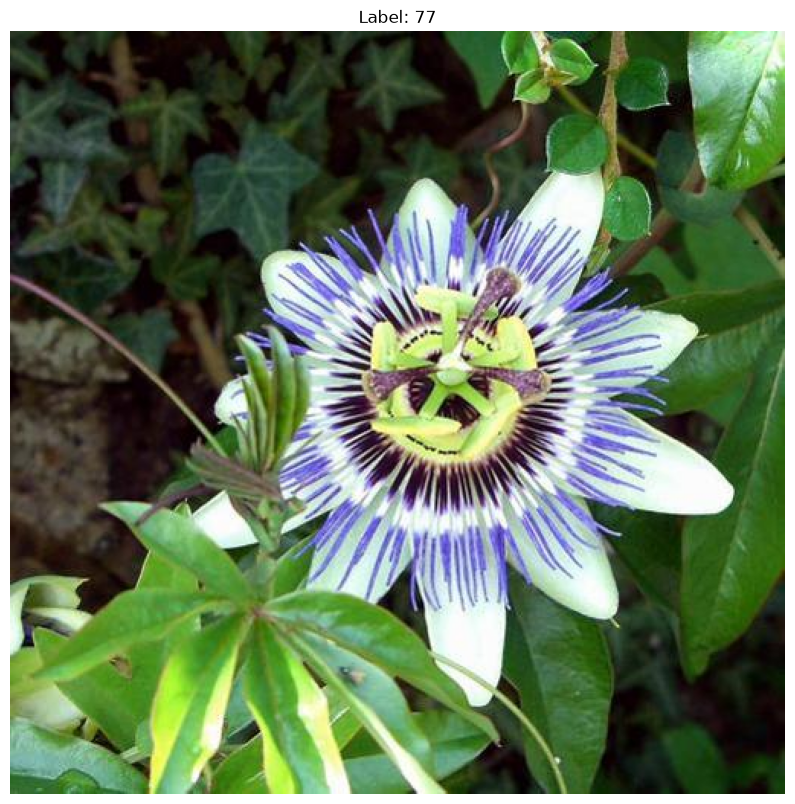

In [4]:
for i in range(5):
    img, label, _ = train_dataset[i]
    print("Image size:", img.shape)
    plot_image(img, title=f"Label: {label}")

### 3. Extract deep convolutional features

In the original paper <ref>[1]</ref>, `SIFT` and `RootSIFT` features were used. Hence, the default parameter of the embedding would be `RootSIFT`. However, here, I would like to demonstrate the usage of deep convolutional features, as mentioned in <ref>[2]</ref>.

We use `DeepConvFeature` from our code. For demonstration, we'll pick `resnet18` and the last conv layer.

In [5]:
extractor = DeepConvFeature(
    backbone="resnet18",
    layer_index=-1,  # Last conv layer
)

### Declare the VLAD embedder

In [6]:
vlad_embedder_no_pca = VLADEmbedder(feature_extractor=extractor, n_clusters=NUM_CLUSTERS)

The following cell trains the model from scratch on the training images. It might take quite a bit of time.

In [7]:
vlad_embedder_no_pca.learn(image for image, *_ in train_dataset)

/home/critter_cool_laptop/workspace/Python-Visual-Similarity-Examples/.venv/lib/python3.14/site-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /__w/pytorch/pytorch/torch/csrc/utils/tensor_numpy.cpp:213.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()


[INFO] Learning the visual vocabulary with the following parameters:
   - Number of clusters: 32
   - Feature Extractor used: DeepConvFeature
   - Dimension of the feature space: 512


If you have issue with the runtime, you can follow this procedure instead:
1) Train the embedder once.
2) Save it using `save_to_disk`.
3) Load it back later using `VLADEmbedder.load_from_disk`.

### Build the image store

This embeds every training image and indexes the embeddings in an `InMemoryImageEmbeddingStore`. The store will come handy as we do image retrieval later on. For that, we first need to compute some variables from the dataset.

In [8]:
paths = train_dataset.image_paths
labels_by_path = dict(zip(paths, train_dataset.labels, strict=True))

In [9]:
vlad_store = InMemoryImageEmbeddingStore(image_paths=paths, embedder=vlad_embedder_no_pca)

Similar to above, but here, the dimension of each feature vector is reduced `by half` using `PCA`.

### Declare the VLAD embedder (with PCA)

In [10]:
vlad_embedder_with_pca = VLADEmbedder(feature_extractor=extractor, n_clusters=NUM_CLUSTERS)

In [11]:
vlad_embedder_with_pca.learn(
    (image for image, *_ in train_dataset), dim_reduction_factor=DIM_REDUCTION_FACTOR
)

[INFO] Learning the visual vocabulary with the following parameters:
   - Number of clusters: 32
   - Feature Extractor used: DeepConvFeature
   - Dimension of the feature space: 512
   - New dimension after PCA reduction: 256


In [12]:
vlad_store_pca = InMemoryImageEmbeddingStore(
    image_paths=paths, embedder=vlad_embedder_with_pca
)

## **5. Compare some images**

We will now use the trained VLAD embedders to compute similarity between some images.

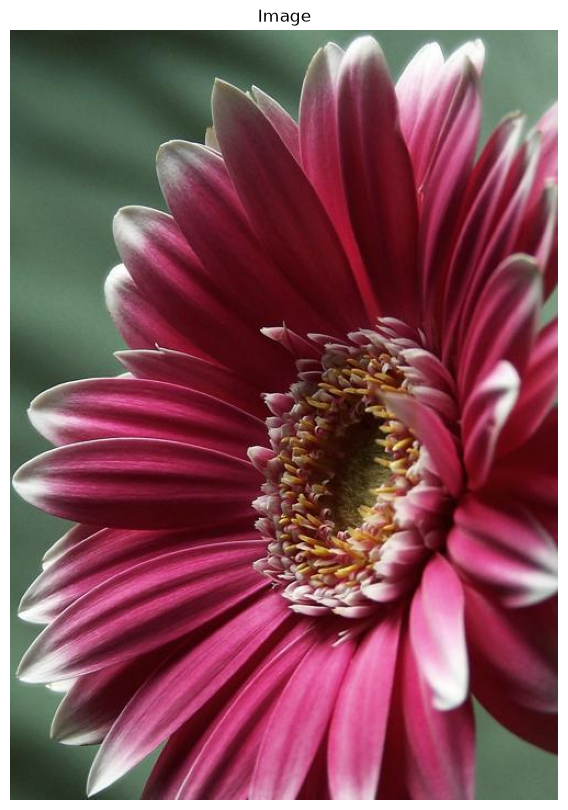

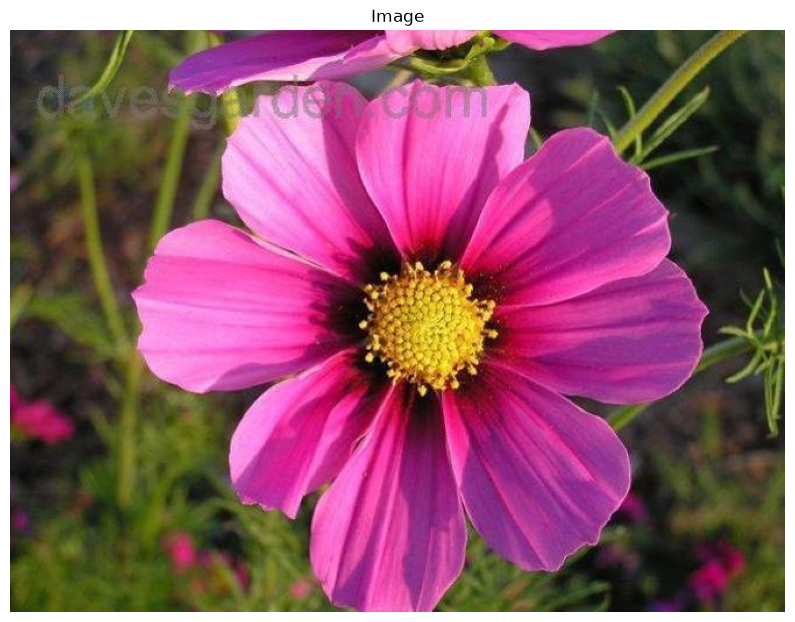

In [13]:
image_1, label_1, path_1 = train_dataset[2005]
image_2, label_2, path_2 = val_dataset[401]
plot_image(image_1)
plot_image(image_2)

Now, we compare the two images. `cosine similarity` is used in this case.

In [14]:
sim_with_pca = vlad_embedder_with_pca.similarity_score(image_1, image_2)
print("Similarity Score, with PCA: ", sim_with_pca)
sim_without_pca = vlad_embedder_no_pca.similarity_score(image_1, image_2)
print("Similarity Score, without PCA: ", sim_without_pca)

Similarity Score, with PCA:  [[0.11875041]]
Similarity Score, without PCA:  [[0.06100775]]


## **6. Fetch the most similar image in the dataset, given a query image**


Now, we will select an image in the validation dataset, on which the model is not yet trained:

In [15]:
query_image, query_label, query_path = val_dataset[103]

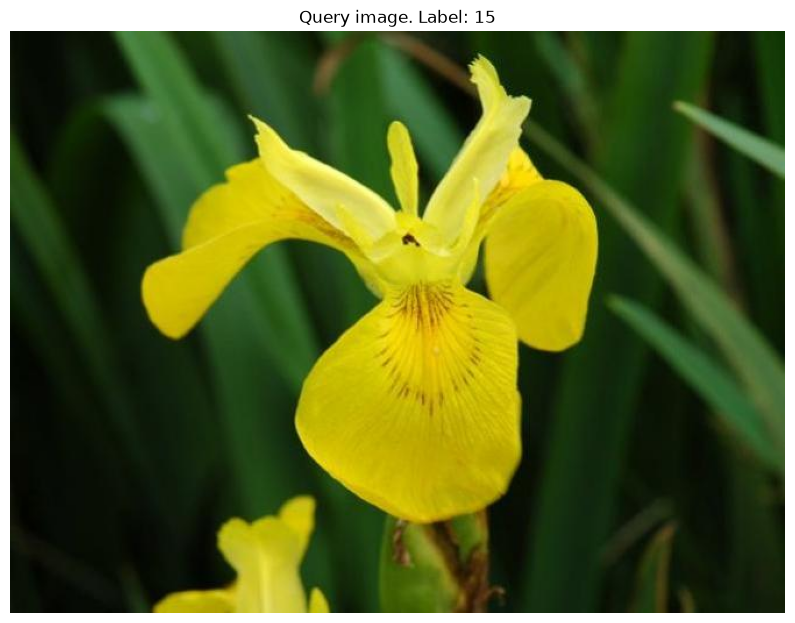

In [16]:
plot_image(query_image, title=f"Query image. Label: {query_label}")

Retrieve top-k most similar images using the stores built above. We will see how it works, with and without PCA.

Each result is a `Candidate` holding the `path` of the retrieved image and its `score`. The stores are built in the `cosine` space, so the score is the cosine distance `1 - cosine_similarity`, and **lower means more similar**.

In [17]:
top_k_vlad_pca = vlad_store_pca.retrieve_top_k_similar(query_image)[0]
print("Evaluation of VLAD with PCA:")
for candidate in top_k_vlad_pca:
    print(
        f"Path: {os.path.basename(candidate.path)}, Cosine distance: {candidate.score:.4f}"
    )

top_k_vlad_no_pca = vlad_store.retrieve_top_k_similar(query_image)[0]
print("\nEvaluation of VLAD without PCA:")
for candidate in top_k_vlad_no_pca:
    print(
        f"Path: {os.path.basename(candidate.path)}, Cosine distance: {candidate.score:.4f}"
    )

Evaluation of VLAD with PCA:
Path: image_06355.jpg, Cosine distance: 0.6708
Path: image_06383.jpg, Cosine distance: 0.6899
Path: image_06353.jpg, Cosine distance: 0.6950
Path: image_01091.jpg, Cosine distance: 0.7240
Path: image_06367.jpg, Cosine distance: 0.7468

Evaluation of VLAD without PCA:
Path: image_06353.jpg, Cosine distance: 0.7168
Path: image_06355.jpg, Cosine distance: 0.7204
Path: image_06351.jpg, Cosine distance: 0.7450
Path: image_06366.jpg, Cosine distance: 0.7468
Path: image_06383.jpg, Cosine distance: 0.7554


### Let's plot the top-k images next to each other.


a) Using Model trained on data with PCA

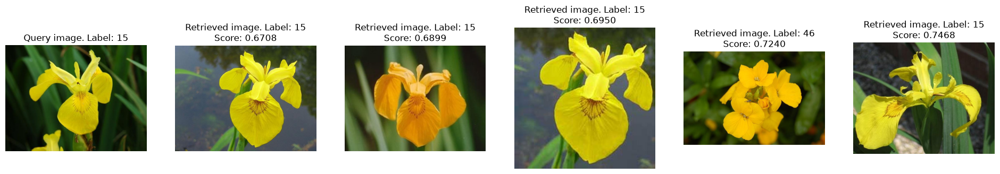

In [18]:
plot_candidates(query_image, query_label, top_k_vlad_pca, labels_by_path)

b) Using model trained on full data

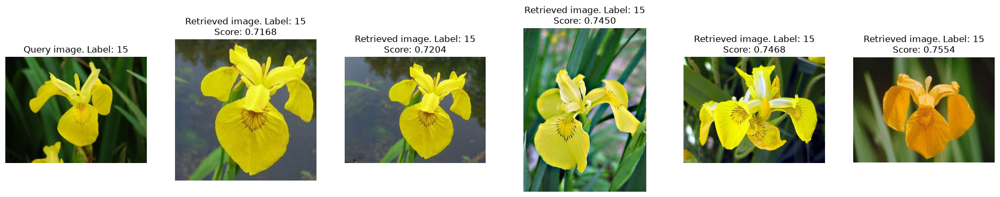

In [19]:
plot_candidates(query_image, query_label, top_k_vlad_no_pca, labels_by_path)

## **7. Similar to above, we will do the exact things for the Fisher Vector**

The implementation for both VLAD and Fisher Vectors are identical. After all, VLAD is simply a simplified case of Fisher Vector.

The Fisher Vectors are about twice as large as the VLAD vectors, so we free the memory held by the VLAD stores before building the Fisher Vector stores.

In [20]:
del vlad_store, vlad_store_pca

### Instantiate Fisher Vector Embedder

In [21]:
fisher_embedder_no_pca = FisherVectorEmbedder(
    feature_extractor=extractor, n_components=NUM_CLUSTERS
)

The following cell trains the model from scratch as well. It might take quite a bit of time (even longer than VLAD).

In [22]:
fisher_embedder_no_pca.learn(image for image, *_ in train_dataset)

[INFO] Learning the visual vocabulary with the following parameters:
   - Number of clusters: 32
   - Feature Extractor used: DeepConvFeature
   - Dimension of the feature space: 512


### Build the image store

In [23]:
fisher_store = InMemoryImageEmbeddingStore(
    image_paths=paths, embedder=fisher_embedder_no_pca
)

Similar to above, if you run into runtime issues, consider saving the trained embedder using `save_to_disk` and loading it back later. You can also fit a Gaussian Mixture model in advance and pass it to `load_clustering_model_from_sklearn`. The Gaussian Mixture object can be imported as:

```python
from sklearn.mixture import GaussianMixture
```

Note that only `covariance_type="diag"` is supported. Otherwise, the implementation is identical to that of `VLADEmbedder`.

### Instantiate Fisher Vector Embedder with PCA

In [24]:
fisher_embedder_with_pca = FisherVectorEmbedder(
    feature_extractor=extractor, n_components=NUM_CLUSTERS
)

In [25]:
fisher_embedder_with_pca.learn(
    (image for image, *_ in train_dataset), dim_reduction_factor=DIM_REDUCTION_FACTOR
)

[INFO] Learning the visual vocabulary with the following parameters:
   - Number of clusters: 32
   - Feature Extractor used: DeepConvFeature
   - Dimension of the feature space: 512
   - New dimension after PCA reduction: 256


/home/critter_cool_laptop/workspace/Python-Visual-Similarity-Examples/.venv/lib/python3.14/site-packages/pyvisim/classic/_base_embedder.py:384: FutureWarning: Best of 1 EM run(s) did not converge within 100 iterations; consider raising max_iter, raising tol or increasing n_init.
  self._clustering_model.fit(features)


In [26]:
fisher_store_pca = InMemoryImageEmbeddingStore(
    image_paths=paths, embedder=fisher_embedder_with_pca
)

### Compute similarity of two images

In [27]:
image_similarity_with_pca = fisher_embedder_with_pca.similarity_score(image_1, image_2)
image_similarity_without_pca = fisher_embedder_no_pca.similarity_score(image_1, image_2)
print("Fisher Similarity Score, with PCA: ", image_similarity_with_pca)
print("Fisher Similarity Score, without PCA: ", image_similarity_without_pca)

Fisher Similarity Score, with PCA:  [[0.01548355]]
Fisher Similarity Score, without PCA:  [[0.02855548]]


### Retrieve top-k most similar images

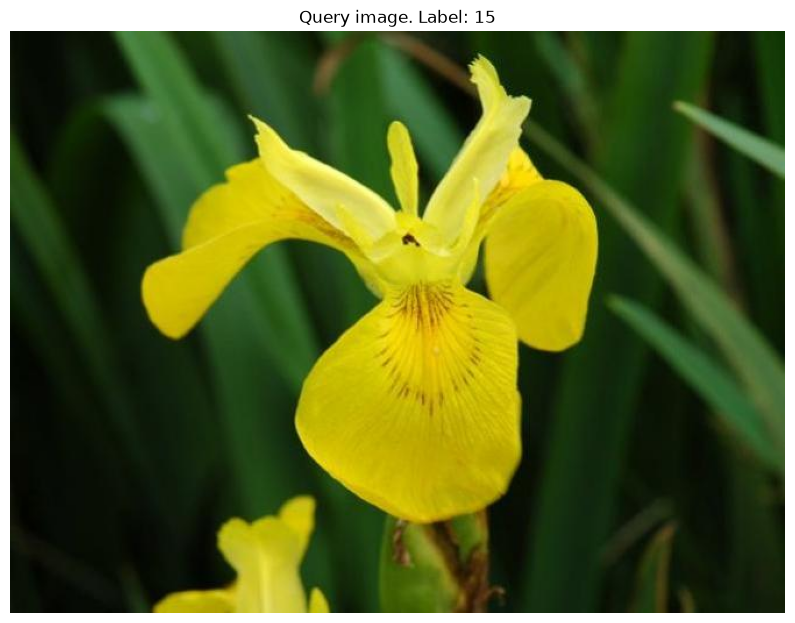

In [28]:
plot_image(query_image, title=f"Query image. Label: {query_label}")

In [29]:
top_k_fisher_pca = fisher_store_pca.retrieve_top_k_similar(query_image)[0]
print("Evaluation of Fisher Vector with PCA:")
for candidate in top_k_fisher_pca:
    print(
        f"Path: {os.path.basename(candidate.path)}, Cosine distance: {candidate.score:.4f}"
    )

top_k_fisher_no_pca = fisher_store.retrieve_top_k_similar(query_image)[0]
print("\nEvaluation of Fisher Vector without PCA:")
for candidate in top_k_fisher_no_pca:
    print(
        f"Path: {os.path.basename(candidate.path)}, Cosine distance: {candidate.score:.4f}"
    )

Evaluation of Fisher Vector with PCA:
Path: image_06353.jpg, Cosine distance: 0.8438
Path: image_06355.jpg, Cosine distance: 0.8628
Path: image_06383.jpg, Cosine distance: 0.8710
Path: image_00935.jpg, Cosine distance: 0.8735
Path: image_01837.jpg, Cosine distance: 0.8764

Evaluation of Fisher Vector without PCA:
Path: image_06353.jpg, Cosine distance: 0.7959
Path: image_06355.jpg, Cosine distance: 0.8012
Path: image_06383.jpg, Cosine distance: 0.8018
Path: image_06389.jpg, Cosine distance: 0.8441
Path: image_04666.jpg, Cosine distance: 0.8468


### Let's plot top-k images next to each other.
a) Using Model trained on Data with PCA

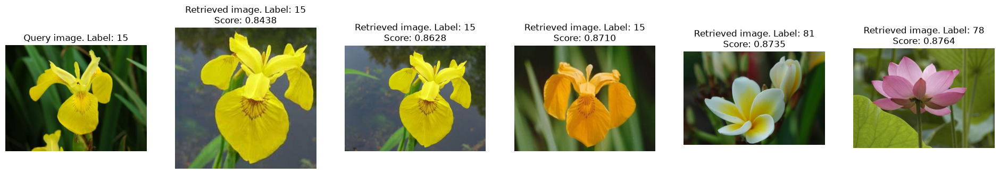

In [30]:
plot_candidates(query_image, query_label, top_k_fisher_pca, labels_by_path)

b) Using Model trained on full data

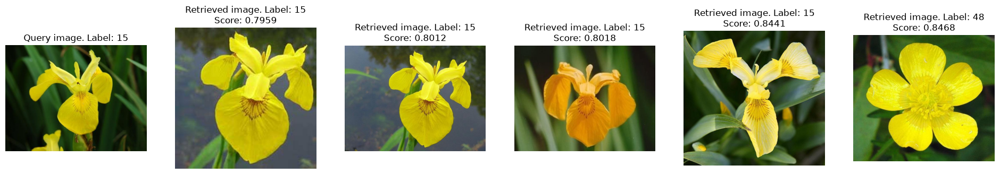

In [31]:
plot_candidates(query_image, query_label, top_k_fisher_no_pca, labels_by_path)